In [1]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("C:\\Users\\admin\\Desktop\\gold_price_data.csv")

In [3]:
data.head()

,Date,Value
0,1970-01-01,35.2
1,1970-04-01,35.1
2,1970-07-01,35.4
3,1970-10-01,36.2
4,1971-01-01,37.4


In [4]:
data.isnull().sum()

Date     0
Value    0
dtype: int64

In [5]:
data.describe()

,Value
count,10787.000000
mean,653.596634
std,434.030848
min,35.100000
25%,349.200000
50%,409.350000
75%,1061.625000
max,1895.000000


In [6]:
#Indexing date
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace= True)

In [7]:
#Resample data to 1 day format , fill values with latest value and get mean if one day has several values
data = data["Value"].resample("1D").mean().fillna(method = "ffill").to_frame()
dates = data.index

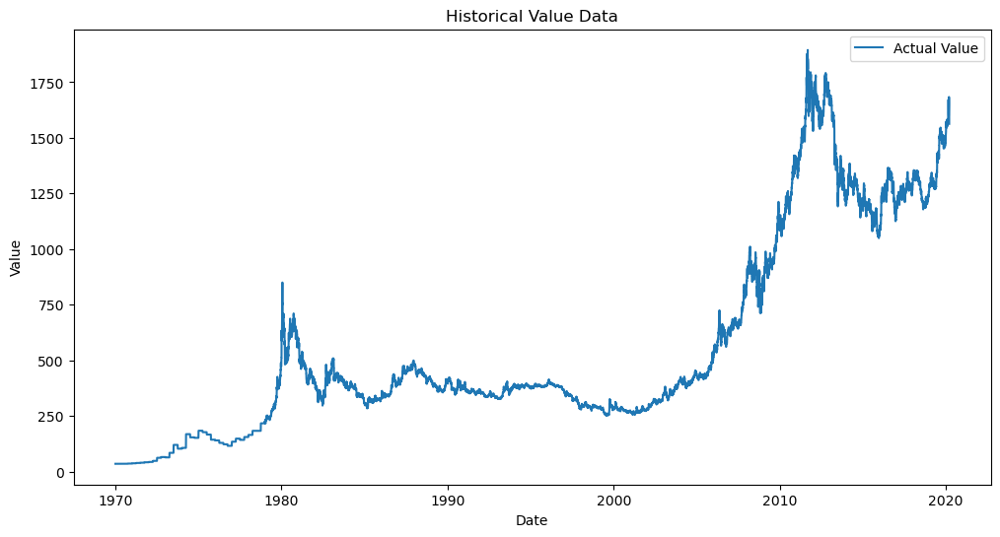

In [8]:
plt.figure(figsize=(12, 6))
plt.plot(data['Value'], label='Actual Value')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Historical Value Data')
plt.legend()
plt.show()

In [9]:
#data['Lagged_Value'] = data['Value'].shift(1)
#data['Moving_Average_7'] = data['Value'].rolling(window=7).mean()

In [10]:
#Backfill NaN values in this columns , because this nans are at the start
#data['Lagged_Value'] = data['Lagged_Value'].fillna(method='bfill')
#data['Moving_Average_7'] = data['Moving_Average_7'].fillna(method='bfill')

In [11]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from keras.callbacks import EarlyStopping
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [12]:
train_size = int(len(data) * 0.8)
val_size = int(len(data) * 0.1)
train_data, val_data, test_data = data[:train_size], data[train_size:train_size+val_size], data[train_size+val_size:]

In [13]:
from pmdarima import auto_arima

In [14]:
auto_model = auto_arima(train_data['Value'], seasonal=True, m=12, stepwise=True, trace=True, error_action='ignore',
                        suppress_warnings=True, max_order=None, 
                        seasonal_order=(0,0,0,0))

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12] intercept   : AIC=89556.505, Time=23.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=89635.133, Time=0.19 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=89621.745, Time=1.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=89621.954, Time=2.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=89636.107, Time=0.15 sec
 ARIMA(2,1,2)(0,0,1)[12] intercept   : AIC=89578.741, Time=13.87 sec
 ARIMA(2,1,2)(1,0,0)[12] intercept   : AIC=89578.913, Time=13.28 sec
 ARIMA(2,1,2)(2,0,1)[12] intercept   : AIC=89558.946, Time=48.60 sec
 ARIMA(2,1,2)(1,0,2)[12] intercept   : AIC=89557.081, Time=47.62 sec
 ARIMA(2,1,2)(0,0,0)[12] intercept   : AIC=89580.882, Time=8.05 sec
 ARIMA(2,1,2)(0,0,2)[12] intercept   : AIC=89575.303, Time=32.55 sec
 ARIMA(2,1,2)(2,0,0)[12] intercept   : AIC=89575.788, Time=30.33 sec
 ARIMA(2,1,2)(2,0,2)[12] intercept   : AIC=inf, Time=52.60 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=89620.868, Time=8.01 sec
 AR

In [15]:
best_order = auto_model.order
best_seasonal_order = auto_model.seasonal_order
best_arima_model = ARIMA(train_data['Value'], order=best_order, seasonal_order=best_seasonal_order)
best_arima_fit = best_arima_model.fit()

C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [16]:
import itertools
param_grid = {
    'seasonal': ['add', 'mul'],
    'seasonal_periods': [12, 30, 365],  # Change these values as needed
    'trend': ['add', None],
}

best_model = None
best_mae = float('inf')

# Perform grid search
for params in itertools.product(*param_grid.values()):
    params_dict = dict(zip(param_grid.keys(), params))
    ets_model = ExponentialSmoothing(train_data['Value'], **params_dict)
    ets_fit = ets_model.fit()

    val_forecast = ets_fit.forecast(steps=len(val_data))
    val_mae = mean_absolute_error(val_data['Value'], val_forecast)

    if val_mae < best_mae:
        best_mae = val_mae
        best_model = ets_fit
        best_params = params_dict
print("Best ETS Parameters:", best_params)
print("Best Validation MAE:", best_mae)


C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(
C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Best ETS Parameters: {'seasonal': 'mul', 'seasonal_periods': 365, 'trend': 'add'}
Best Validation MAE: 226.64552012694662


C:\Users\admin\AppData\Roaming\Python\Python39\site-packages\statsmodels\tsa\holtwinters\model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [17]:
#ets_model = ExponentialSmoothing(train_data['Value'], seasonal='mul', seasonal_periods=365,trend = 'add')
#ets_fit = ets_model.fit(method = 'trust-constr')

In [18]:
ets_val_forecast = best_model.forecast(steps=len(val_data))

# Calculate RMSE and MAE
ets_val_rmse = np.sqrt(mean_squared_error(val_data['Value'], ets_val_forecast))
ets_val_mae = mean_absolute_error(val_data['Value'], ets_val_forecast)

print(f"Validation RMSE for ETS: {ets_val_rmse}")
print(f"Validation MAE for ETS: {ets_val_mae}")

Validation RMSE for ETS: 259.0255389256761
Validation MAE for ETS: 226.64552012694662


In [19]:
val_forecast = best_arima_fit.forecast(steps=len(val_data))

In [20]:
val_rmse = np.sqrt(mean_squared_error(val_data['Value'], val_forecast))
val_mae = mean_absolute_error(val_data['Value'], val_forecast)

print(f"Validation RMSE for ARIMA: {val_rmse}")
print(f"Validation MAE for ARIMA: {val_mae}")

Validation RMSE for ARIMA: 383.623428567564
Validation MAE for ARIMA: 328.5158973065648


In [21]:
# LSTM model
scaler = MinMaxScaler()
scaled_train_data = scaler.fit_transform(train_data)
scaled_val_data = scaler.transform(val_data)
scaled_test_data = scaler.transform(test_data)

scaled_train_data = scaled_train_data.reshape(scaled_train_data.shape[0], scaled_train_data.shape[1], 1)
scaled_val_data = scaled_val_data.reshape(scaled_val_data.shape[0], scaled_val_data.shape[1], 1)
scaled_test_data = scaled_test_data.reshape(scaled_test_data.shape[0], scaled_test_data.shape[1], 1)
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, input_shape=input_shape, activation='relu', return_sequences=True))
    model.add(Dense(1))
    from keras.optimizers import Adam
    learning_rate = 0.001
    model.compile(loss='mse', optimizer=Adam(learning_rate=learning_rate), metrics=['mean_absolute_error'])
    return model
input_shape = (scaled_train_data.shape[1], scaled_train_data.shape[2])
lstm_model = create_lstm_model(input_shape)

early_stopping = EarlyStopping(patience=10, restore_best_weights=True)

history = lstm_model.fit(
    scaled_train_data, scaled_train_data[:, 0],
    validation_data=(scaled_val_data, scaled_val_data[:, 0]),
    epochs=50, batch_size=32, verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/50
459/459 [==============================] - 2s 2ms/step - loss: 0.0219 - mean_absolute_error: 0.0980 - val_loss: 0.0189 - val_mean_absolute_error: 0.1373
Epoch 2/50
459/459 [==============================] - 1s 2ms/step - loss: 6.4043e-04 - mean_absolute_error: 0.0171 - val_loss: 0.0360 - val_mean_absolute_error: 0.1733
Epoch 3/50
459/459 [==============================] - 1s 2ms/step - loss: 2.0466e-04 - mean_absolute_error: 0.0112 - val_loss: 0.0316 - val_mean_absolute_error: 0.1630
Epoch 4/50
459/459 [==============================] - 1s 2ms/step - loss: 1.5358e-04 - mean_absolute_error: 0.0096 - val_loss: 0.0222 - val_mean_absolute_error: 0.1366
Epoch 5/50
459/459 [==============================] - 1s 2ms/step - loss: 9.8970e-05 - mean_absolute_error: 0.0077 - val_loss: 0.0125 - val_mean_absolute_error: 0.1017
Epoch 6/50
459/459 [==============================] - 1s 2ms/step - loss: 5.4013e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0068 - val_mean_absolute_error: 0.0

In [22]:
# Trying boosting models
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.001, 0.01, 0.1],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}
xgb_best_model = None
xgb_best_mae = float('inf')
x_train = train_data.copy()

x_train['Shifted_value'] = train_data['Value'].shift(1)
x_train['Moving_Average_7'] = x_train['Value'].rolling(window=7).mean()
x_train['Moving_Average_30'] = x_train['Value'].rolling(window=30).mean()
x_train['Moving_Average_30'] = x_train['Moving_Average_30'].fillna(method='bfill')
x_train['Shifted_value'] = x_train['Shifted_value'].fillna(method='bfill')
x_train['Moving_Average_7'] = x_train['Moving_Average_7'].fillna(method='bfill')
x_train = x_train.drop(['Value'],axis=1)
x_train.reset_index(drop=False, inplace=True)
x_train['DayOfWeek'] = x_train['Date'].dt.dayofweek
x_train['Month'] = x_train['Date'].dt.month
x_train['Year'] = x_train['Date'].dt.year
x_train = x_train.drop(['Date'],axis=1)
y_train = train_data['Value']
scaler = MinMaxScaler()

x_val = val_data.copy()
x_val['Shifted_value'] = val_data['Value'].shift(1)
x_val['Moving_Average_7'] = x_val['Value'].rolling(window=7).mean()
x_val['Moving_Average_7'] = x_val['Moving_Average_7'].fillna(method='bfill')
x_val['Moving_Average_30'] = x_val['Value'].rolling(window=7).mean()
x_val['Moving_Average_30'] = x_val['Moving_Average_30'].fillna(method='bfill')
x_val['Shifted_value'] = x_val['Shifted_value'].fillna(method='bfill')
x_val = x_val.drop(['Value'],axis=1)
x_val.reset_index(drop=False, inplace=True)
x_val['DayOfWeek'] = x_val['Date'].dt.dayofweek
x_val['Month'] = x_val['Date'].dt.month
x_val['Year'] = x_val['Date'].dt.year
x_val = x_val.drop(['Date'],axis=1)
y_val = val_data['Value']
feature_columns = ['Moving_Average_30','Moving_Average_7', 'Shifted_value', 'DayOfWeek', 'Month', 'Year']

x_val = x_val[feature_columns]
x_train = x_train[feature_columns]


for params in itertools.product(*xgb_param_grid.values()):
    params_dict = dict(zip(xgb_param_grid.keys(), params))
    xgb_model = XGBRegressor(**params_dict)
    xgb_fit = xgb_model.fit(x_train, y_train)  

    xgb_val_forecast = xgb_fit.predict(x_val)  
    xgb_val_mae = mean_absolute_error(y_val, xgb_val_forecast)  

    if xgb_val_mae < xgb_best_mae:
        xgb_best_mae = xgb_val_mae
        xgb_best_model = xgb_fit
        xgb_best_params = params_dict

print("Best XGBoost Parameters:", xgb_best_params)
print("Best Validation MAE:", xgb_best_mae)

Best XGBoost Parameters: {'n_estimators': 300, 'max_depth': 3, 'learning_rate': 0.1, 'gamma': 0.1, 'subsample': 1.0, 'colsample_bytree': 1.0}
Best Validation MAE: 240.70075884713413


In [23]:
xgb_val_forecast = xgb_best_model.predict(x_val)

# Calculate RMSE and MAE
xgb_val_rmse = np.sqrt(mean_squared_error(val_data['Value'], xgb_val_forecast))
xgb_val_mae = mean_absolute_error(val_data['Value'], xgb_val_forecast)

print(f"Validation RMSE for ETS: {xgb_val_rmse}")
print(f"Validation MAE for ETS: {xgb_val_mae}")

Validation RMSE for ETS: 308.5609103721983
Validation MAE for ETS: 240.70075884713413


In [24]:
from catboost import CatBoostRegressor


param_grid = {
    'iterations': [100, 500, 1000],
    'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.4],
    'depth': [4, 6, 8]
}


catboost_model = CatBoostRegressor()

grid_search = GridSearchCV(catboost_model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2)
grid_search.fit(x_train, y_train)

best_catboost_model = grid_search.best_estimator_
best_cat_params = grid_search.best_params_

catboost_val_forecast = best_catboost_model.predict(x_val)


catboost_val_rmse = np.sqrt(mean_squared_error(y_val, catboost_val_forecast))
catboost_val_mae = mean_absolute_error(y_val, catboost_val_forecast)

print("Best CatBoost Parameters:", best_cat_params)
print("CatBoost Validation RMSE:", catboost_val_rmse)
print("CatBoost Validation MAE:", catboost_val_mae)

Fitting 3 folds for each of 45 candidates, totalling 135 fits
0:	learn: 178.5574117	total: 154ms	remaining: 15.2s
1:	learn: 178.3881914	total: 155ms	remaining: 7.61s
2:	learn: 178.2213875	total: 157ms	remaining: 5.06s
3:	learn: 178.0543855	total: 158ms	remaining: 3.79s
4:	learn: 177.8884214	total: 159ms	remaining: 3.02s
5:	learn: 177.7239595	total: 160ms	remaining: 2.51s
6:	learn: 177.5588514	total: 161ms	remaining: 2.14s
7:	learn: 177.3917478	total: 162ms	remaining: 1.87s
8:	learn: 177.2238441	total: 163ms	remaining: 1.65s
9:	learn: 177.0642530	total: 165ms	remaining: 1.48s
10:	learn: 176.8997269	total: 166ms	remaining: 1.34s
11:	learn: 176.7341250	total: 167ms	remaining: 1.22s
12:	learn: 176.5722469	total: 168ms	remaining: 1.12s
13:	learn: 176.4063955	total: 169ms	remaining: 1.04s
14:	learn: 176.2446365	total: 170ms	remaining: 964ms
15:	learn: 176.0787596	total: 171ms	remaining: 899ms
16:	learn: 175.9122913	total: 172ms	remaining: 842ms
17:	learn: 175.7457640	total: 173ms	remaining: 

In [25]:
import lightgbm as lgb


param_grid = {
    'num_leaves': [10, 20, 30, 40, 50],
    'learning_rate': [0.01, 0.05, 0.1 , 0.2],
    'max_depth': [5, 10, 15, -1],
    'min_child_samples': [10, 20, 30, 40],
    'force_col_wise': [True,False],

}

lgb_model = lgb.LGBMRegressor(objective='regression')
grid_search = GridSearchCV(estimator=lgb_model, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=5, verbose=2)
grid_search.fit(x_train, y_train)

best_lgbm_model = grid_search.best_estimator_
best_lgbm_params = grid_search.best_params_

lgbm_val_forecast = best_lgbm_model.predict(x_val)

lgbm_val_rmse = np.sqrt(mean_squared_error(y_val, lgbm_val_forecast))
lgbm_val_mae = mean_absolute_error(y_val,lgbm_val_forecast)


print("Best LGBM parameters:", best_lgbm_params)
print("LGBM Validation RSME", lgbm_val_rmse)
print("LGBM Validation mae", lgbm_val_mae)

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
[LightGBM] [Info] Total Bins 819
[LightGBM] [Info] Number of data points in the train set: 11734, number of used features: 6
[LightGBM] [Info] Start training from score 422.728195
[CV] END force_col_wise=True, learning_rate=0.01, max_depth=5, min_child_samples=10, num_leaves=10; total time=   0.1s
[LightGBM] [Info] Total Bins 820
[LightGBM] [Info] Number of data points in the train set: 11734, number of used features: 6
[LightGBM] [Info] Start training from score 352.747904
[CV] END force_col_wise=True, learning_rate=0.01, max_depth=5, min_child_samples=10, num_leaves=10; total time=   0.0s
[LightGBM] [Info] Total Bins 820
[LightGBM] [Info] Number of data points in the train set: 11734, number of used features: 6
[LightGBM] [Info] Start training from score 351.616366
[CV] END force_col_wise=True, learning_rate=0.01, max_depth=5, min_child_samples=10, num_leaves=10; total time=   0.0s
[LightGBM] [Info] Total Bins 820
[Light

In [26]:
arima_forecast = best_arima_fit.forecast(steps=len(test_data))
arima_mse = mean_squared_error(test_data['Value'], arima_forecast)
print(f"ARIMA Mean Squared Error: {arima_mse}")

ets_forecast = best_model.forecast(steps=len(test_data))
ets_mse = mean_squared_error(test_data['Value'],ets_forecast)
print(f"ETS Mean Squared Error: {ets_mse}")

scaler = MinMaxScaler()
scaled_train_data = scaler.fit_transform(train_data)
scaled_val_data = scaler.transform(val_data)
scaled_test_data = scaler.transform(test_data)
scaled_train_data = scaled_train_data.reshape(scaled_train_data.shape[0], scaled_train_data.shape[1], 1)
scaled_val_data = scaled_val_data.reshape(scaled_val_data.shape[0], scaled_val_data.shape[1], 1)
scaled_test_data = scaled_test_data.reshape(scaled_test_data.shape[0], scaled_test_data.shape[1], 1)
lstm_forecast = lstm_model.predict(scaled_test_data)[:,:,0]
lstm_forecast = scaler.inverse_transform(lstm_forecast)
lstm_mse = mean_squared_error(test_data['Value'], lstm_forecast[:,0])
print(f"LSTM Mean Squared Error: {lstm_mse}")

x_test = test_data.copy()
x_test['Shifted_value'] = test_data['Value'].shift(1)
x_test['Moving_Average_7'] = x_test['Value'].rolling(window=7).mean()
x_test['Moving_Average_7'] = x_test['Moving_Average_7'].fillna(method='bfill')
x_test['Shifted_value'] = x_test['Shifted_value'].fillna(method='bfill')
x_test['Moving_Average_30'] = x_test['Value'].rolling(window=7).mean()
x_test['Moving_Average_30'] = x_test['Moving_Average_30'].fillna(method='bfill')
x_test = x_test.drop(['Value'],axis=1)
x_test.reset_index(drop=False, inplace=True)
x_test['DayOfWeek'] = x_test['Date'].dt.dayofweek
x_test['Month'] = x_test['Date'].dt.month
x_test['Year'] = x_test['Date'].dt.year
x_test = x_test.drop(['Date'],axis=1)
feature_columns = ['Moving_Average_30','Moving_Average_7', 'Shifted_value', 'DayOfWeek', 'Month', 'Year']
x_test = x_test[feature_columns]

xgb_forecast = xgb_best_model.predict(x_test)
xgb_mse = mean_squared_error(test_data['Value'],xgb_forecast)
print(f"XGB Mean Squared Error: {xgb_mse}")

cat_forecast = best_catboost_model.predict(x_test)
cat_mse = mean_squared_error(test_data['Value'],cat_forecast)
print(f"CatBoost Mean Squared Error: {cat_mse}")

lgbm_forecast = best_lgbm_model.predict(x_test)
lgbm_mse = mean_squared_error(test_data['Value'],lgbm_forecast)
print(f"Light GBM Mean Squared Error: {lgbm_mse}")

ARIMA Mean Squared Error: 45043.384411319035
ETS Mean Squared Error: 14027.038895066202
58/58 [==============================] - 0s 1ms/step
LSTM Mean Squared Error: 0.40741262735431405
XGB Mean Squared Error: 20068.06144648295
CatBoost Mean Squared Error: 34979.979418545845
Light GBM Mean Squared Error: 34381.76795612702


In [27]:
plt.figure(figsize=(12, 6),dpi=1000)
plt.plot(test_data.index, arima_forecast, label='ARIMA Forecast')
plt.plot(test_data.index, lstm_forecast[:,0], label='LSTM Forecast' ,color='black')
plt.plot(test_data.index, test_data['Value'], label='Actual Test Value',color = 'orange')
plt.plot(test_data.index,ets_forecast,label='ETS forecast',color='green')
plt.plot(test_data.index,xgb_forecast,label='XGB forecast',color= 'yellow')
plt.plot(test_data.index,cat_forecast,label='Cat forecast',color= 'gray')
plt.plot(test_data.index,lgbm_forecast,label='LGBM forecast',color= 'red')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Test Value Forecasting Comparison')
plt.ylim(min(test_data['Value'].min(), arima_forecast.min(), lstm_forecast[:,0].min()) - 10,
         max(test_data['Value'].max(), arima_forecast.max(), lstm_forecast[:,0].max()) + 10)
plt.legend()
plt.show()

47/47 [==============================] - 0s 1ms/step


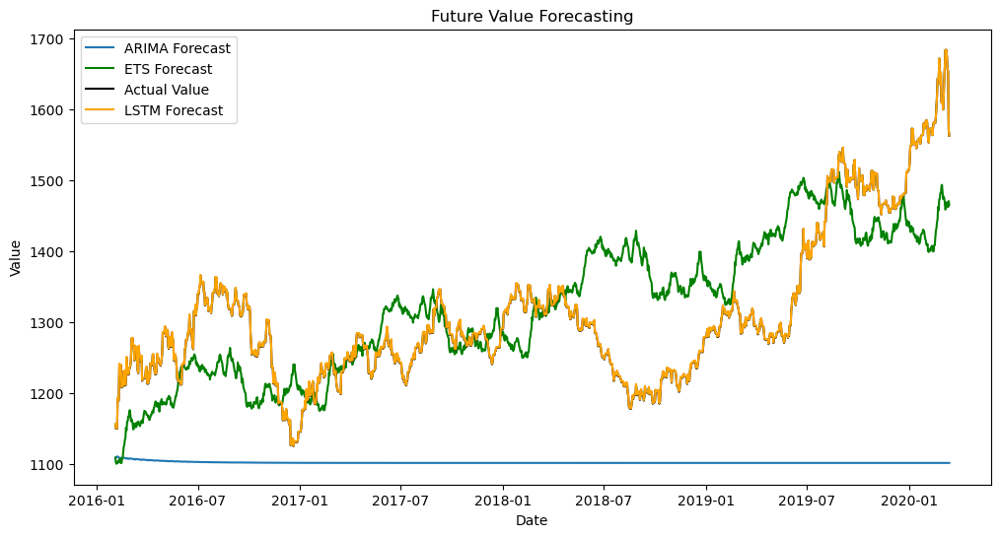

In [28]:
future_periods = 1500  # Adjust as needed
arima_future_forecast = best_arima_fit.forecast(steps=future_periods)
ets_future_forecast = best_model.forecast(steps=future_periods)
lstm_future_forecast = lstm_model.predict(scaled_test_data[-future_periods:])[:, 0]
lstm_future_forecast = lstm_future_forecast.reshape(-1, 1)  # Reshape to (30, 1)
lstm_future_forecast = scaler.inverse_transform(np.column_stack((lstm_future_forecast, np.zeros((future_periods, 2)))))[:, 0]

# Visualize future revenue predictions
plt.figure(figsize=(12, 6))
plt.plot(data.index[-future_periods:], arima_future_forecast, label='ARIMA Forecast')
plt.plot(data.index[-future_periods:], ets_future_forecast, label='ETS Forecast',color='green')
plt.plot(data.index[-future_periods:], test_data['Value'][-future_periods:], label='Actual Value',color = 'black')
plt.plot(data.index[-future_periods:], lstm_future_forecast, label='LSTM Forecast',color='orange')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Future Value Forecasting')
plt.legend()
plt.show()

In [29]:
lstm_mae = mean_absolute_error(test_data['Value'][-future_periods:], lstm_future_forecast)
lstm_mse = mean_squared_error(test_data['Value'][-future_periods:], lstm_future_forecast)
lstm_rmse = mean_squared_error(test_data['Value'][-future_periods:], lstm_future_forecast, squared=False)
print(f"LSTM Mean Absolute Error (MAE): {lstm_mae}")
print(f"LSTM Mean Squared Error (MSE): {lstm_mse}")
print(f"LSTM Root Mean Squared Error (RMSE): {lstm_rmse}")

LSTM Mean Absolute Error (MAE): 0.6177142674051335
LSTM Mean Squared Error (MSE): 0.41674893127892726
LSTM Root Mean Squared Error (RMSE): 0.6455609431176326


In [30]:
ets_mae = mean_absolute_error(test_data['Value'][-future_periods:], ets_future_forecast)
ets_mse = mean_squared_error(test_data['Value'][-future_periods:], ets_future_forecast)
ets_rmse = mean_squared_error(test_data['Value'][-future_periods:], ets_future_forecast, squared=False)
print(f"ETS Mean Absolute Error (MAE): {ets_mae}")
print(f"ETS Mean Squared Error (MSE): {ets_mse}")
print(f"ETS Root Mean Squared Error (RMSE): {ets_rmse}")

ETS Mean Absolute Error (MAE): 74.5476311930222
ETS Mean Squared Error (MSE): 8420.800184202406
ETS Root Mean Squared Error (RMSE): 91.76491804716225


In [31]:
scaler = MinMaxScaler()
scaled_train_data = scaler.fit_transform(train_data)
scaled_val_data = scaler.transform(val_data)
scaled_test_data = scaler.transform(test_data)
scaled_train_data = scaled_train_data.reshape(scaled_train_data.shape[0], scaled_train_data.shape[1], 1)
scaled_val_data = scaled_val_data.reshape(scaled_val_data.shape[0], scaled_val_data.shape[1], 1)
scaled_test_data = scaled_test_data.reshape(scaled_test_data.shape[0], scaled_test_data.shape[1], 1)

xgb_pred = xgb_best_model.predict(x_val)
lgbm_pred = best_lgbm_model.predict(x_val)
catboost_pred = best_catboost_model.predict(x_val)
lstm_pred = lstm_model.predict(scaled_val_data)[:,:,0]
lstm_pred = scaler.inverse_transform(lstm_pred)
ets_pred = best_model.forecast(steps=len(val_data))
lstm_pred = lstm_pred.reshape(-1)

weights = [0.05, 0.025, 0.025,0.85,0.05]  


ensemble_pred = (weights[0] * xgb_pred) + (weights[1] * lgbm_pred) + (weights[2] * catboost_pred) + (weights[3] * lstm_pred) + (weights[4] * ets_pred)



ensemble_rmse = np.sqrt(mean_squared_error(y_val, ensemble_pred))
ensemble_mae = mean_absolute_error(y_val, ensemble_pred)

print(f"Ensemble RMSE: {ensemble_rmse}")
print(f"Ensemble MAE: {ensemble_mae}")

58/58 [==============================] - 0s 1ms/step
Ensemble RMSE: 43.53004340065556
Ensemble MAE: 32.94902572543571


In [32]:
plt.figure(figsize=(12, 6),dpi=1000)

plt.plot(val_data.index, ensemble_pred, label='ensemble' ,color='black')
plt.plot(val_data.index, val_data['Value'], label='Actual  Value',color = 'orange')

plt.xlabel('Date')
plt.ylabel('Value')
plt.title(' Forecasting Comparison')
plt.legend()
plt.show()